##  Finite-Size Lyapunov Exponents (FSLEs)

#### Backward in time FSLEs

https://www.aviso.altimetry.fr/es/data/products/value-added-products/fsle-finite-size-lyapunov-exponents/fsle-description.html

Maxima identify lines of maximum compression that strongly constrain and determine fluid motion (Ovidio et al., 2004)

Where stretching and compression lines intersect (Lagrangian hyperbolic points), such points correspond to areas with strong mixing activity. Fluid is advected here along a compression line and then dispersed away along the stretching line.

In [1]:
import os
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cmocean
import gsw
import imp
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

%matplotlib inline

plt.rcParams['font.size'] = '14'

In [ ]:
workingdir = r'C:\Users\mijakes\checkouts\phd-public'
os.chdir(workingdir) 

In [2]:
import src.importData as imports
import src.calc as calc
import src.settings as settings
import src.concat as ct
import src.interpolation as interp
import src.stats as stats
import src.plots as plots

In [26]:
floatids = [8489, 8490, 8492, 8493]
ema = imports.importFloatData(floatids)

datadir = os.path.join(os.sep, 'Users', 'mijakes', 'checkouts', 'phd', 'data')

ds = imports.importNetCDF(datadir, 'FSLE.nc')
ds = ds.rename({'lat':'latitude', 'lon':'longitude'})

alt_cmems = imports.importNetCDF(datadir, 'CMEMS.nc', datatype ='altimetry')

bathymetry =  imports.importNetCDF(datadir, 'bathy.nc', datatype ='bathy')
bathymetry['depth'] = bathymetry.elevation*-1
new_bathy = bathymetry.coarsen(lon=10).mean().coarsen(lat=10).mean()

start: 2018-10-21
end: 2019-02-23


Text(0.5, 1.0, '2018-10-21 - 2019-02-23')

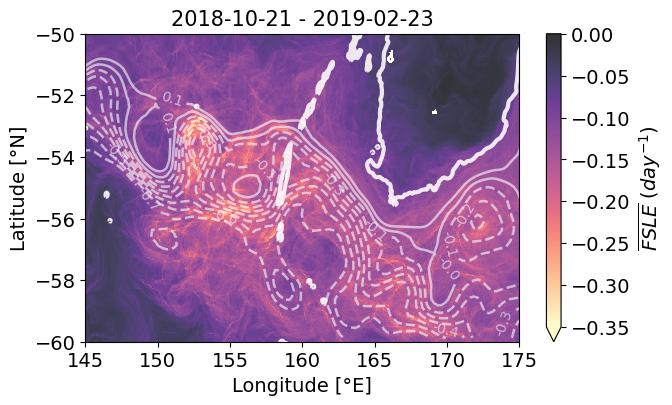

In [5]:
floatid = 8492
float_num = ema[floatid]

rs = calc.findRSperiod(float_num)
dist = calc.cum_dist(float_num.longitude[rs], float_num.latitude[rs])
d_levels = [1500] 

start = float_num.time.values[0]
end = float_num.time.values[-1]
start_time = str(start.astype('M8[D]'))
end_time = str(end.astype('M8[D]'))

print(f'start: {start_time}')
print(f'end: {end_time}')

lat1, lat2 = -60, -50 #-56,-51
lon1, lon2 = 145, 175 #146,160

fig, ax = plt.subplots(figsize = (7,4))

m_fsle = ds.fsle_max.sel(time = slice(start_time, end_time)).mean(dim = 'time')
m_fsle.sel(latitude = slice(lat1, lat2),longitude = slice(lon1, lon2)).plot(cmap = 'magma_r', 
                                    vmin = -0.35, vmax = 0, alpha = 0.8, cbar_kwargs = dict(label = '$\overline{FSLE}$ $(day^{-1})$'))

CS = new_bathy.depth.plot.contour(colors = 'snow', linewidths = 3, levels = d_levels, alpha = 0.9)

msl = alt_cmems.adt.sel(time = slice(start_time, end_time)).mean(dim = 'time')

levels = np.arange(-0.7,0.2,0.1)
CS = msl.plot.contour(colors = 'white', linewidths = 1.8, levels = levels, alpha = 0.6)
plt.clabel(CS, inline=True, fontsize=10, fmt = '%1.1f')

ax.set_xlabel(u'Longitude [\N{DEGREE SIGN}E]')
ax.set_ylabel(u'Latitude [\N{DEGREE SIGN}N]')
plt.title(f'{start_time} - {end_time}', fontsize = 15)

Text(0.03, 0.93, '750-800 km')

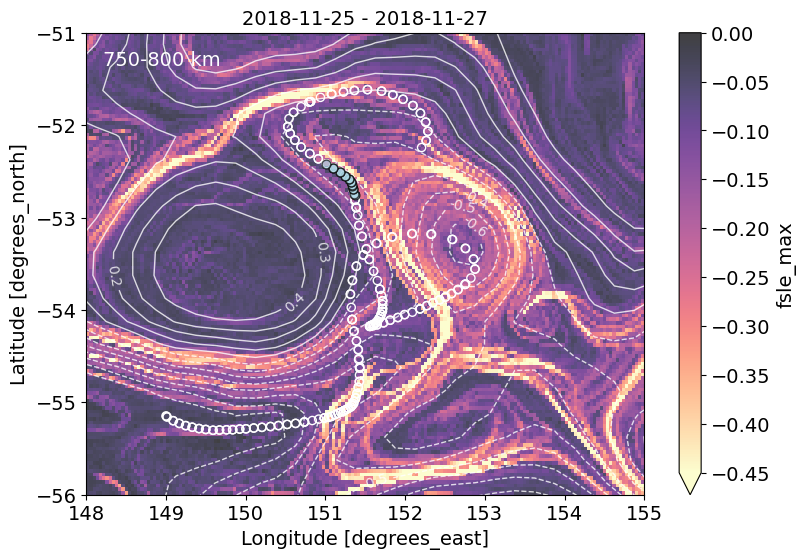

In [6]:
d1, d2 = 750, 800
i_1 = stats.find_nearest(dist, d1)[0]
i_2 = stats.find_nearest(dist, d2)[0]

start = float_num.time[i_1].values
end = float_num.time[i_2].values

start_time, end_time = str(start.astype('M8[D]')),  str(end.astype('M8[D]'))
m_fsle = ds.fsle_max.sel(time = slice(start_time, end_time)).mean(dim = 'time', skipna = True)

levels = np.arange(-0.8,0.4,0.1)
msl = alt_cmems.adt.sel(time = slice(start_time, end_time)).mean(dim = 'time')


fig, ax = plt.subplots(figsize = (9,6))
m_fsle.sel(latitude = slice(-56,-51), longitude = slice(148,155)).plot(vmin = -0.45, vmax = 0, alpha = 0.75, cmap = 'magma_r')

CS = msl.plot.contour(colors = 'w', linewidths = 1, levels = levels, alpha = 0.8)
plt.clabel(CS, inline=True, fontsize=10, fmt = '%1.1f')

plt.scatter(float_num.longitude[rs], float_num.latitude[rs], s = 35, facecolors='none', edgecolors='w', zorder = 4)
plt.scatter(float_num.longitude[i_1:i_2], float_num.latitude[i_1:i_2], s = 40, c = 'lightblue',edgecolors='k', alpha = 0.7, zorder = 4)

ax.set_title(start_time + ' - ' + end_time, fontsize = 14)
ax.text(0.03, 0.93, f'{d1}-{d2} km', c = 'w', transform = ax.transAxes, fontsize = 14, zorder = 5)

In [8]:
floatid = 8489
float_num = ema[floatid]
rs = calc.findRSperiod(float_num)
dist = calc.cum_dist(float_num.longitude[rs], float_num.latitude[rs])

start = float_num.time[rs].values[0]
end = float_num.time[rs].values[-1]

start_time = str(start.astype('M8[D]'))
end_time = str(end.astype('M8[D]'))

In [9]:
print(f'start: {start_time},', f'end: {end_time}')

start: 2018-10-21, end: 2018-12-05


Text(0.5, 1.0, 'FSLE during rapid sampling')

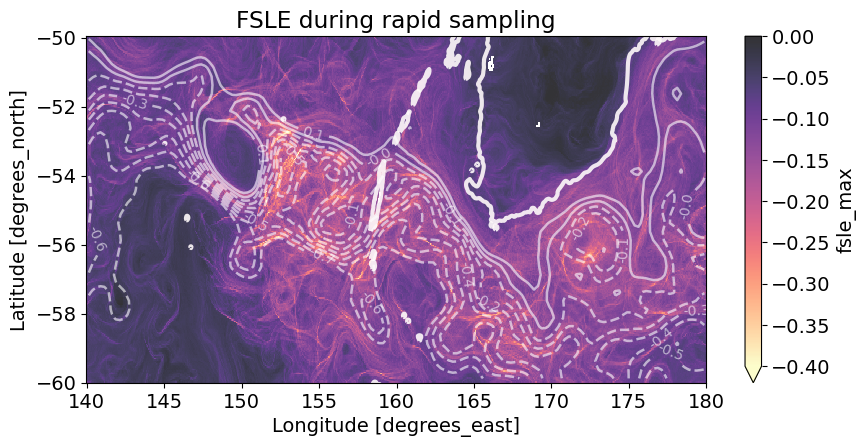

In [16]:
fig, ax = plt.subplots(figsize = (10,4.5))

m_fsle = ds.fsle_max.sel(time = slice(start_time, end_time)).mean(dim = 'time')
m_fsle.plot(cmap = 'magma_r', vmin = -0.4, vmax = 0, alpha = 0.8)

CS = new_bathy.depth.plot.contour(colors = 'snow', linewidths = 3, levels = d_levels, alpha = 0.9)

msl = alt_cmems.adt.sel(time = slice(start_time, end_time)).mean(dim = 'time')

levels = np.arange(-0.7,0.2,0.1)
CS = msl.plot.contour(colors = 'white', linewidths = 1.8, levels = levels, alpha = 0.6)
plt.clabel(CS, inline=True, fontsize=10, fmt = '%1.1f')

plt.title('FSLE during rapid sampling')

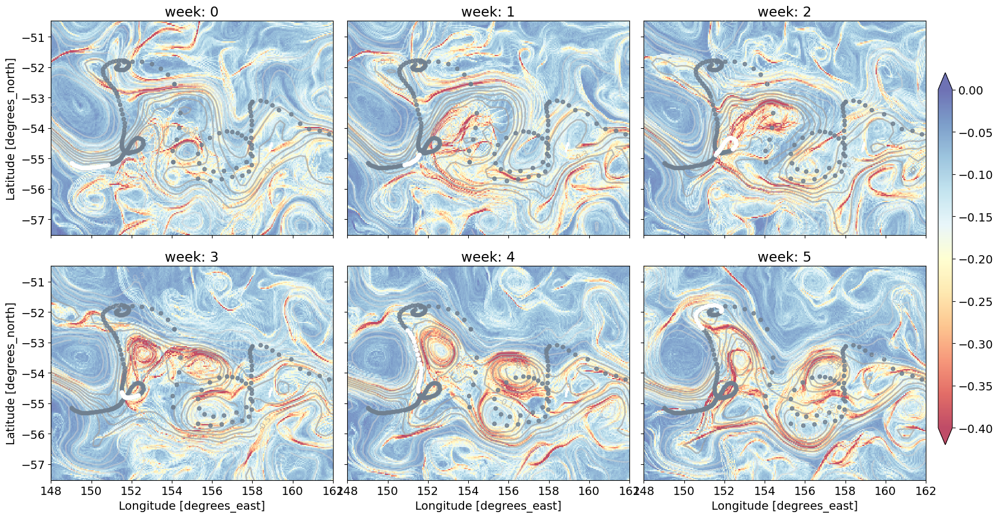

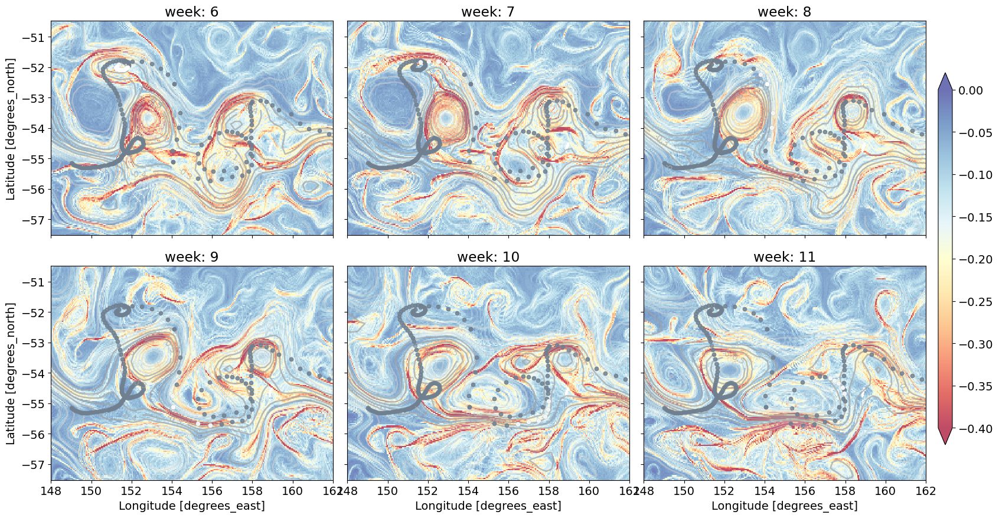

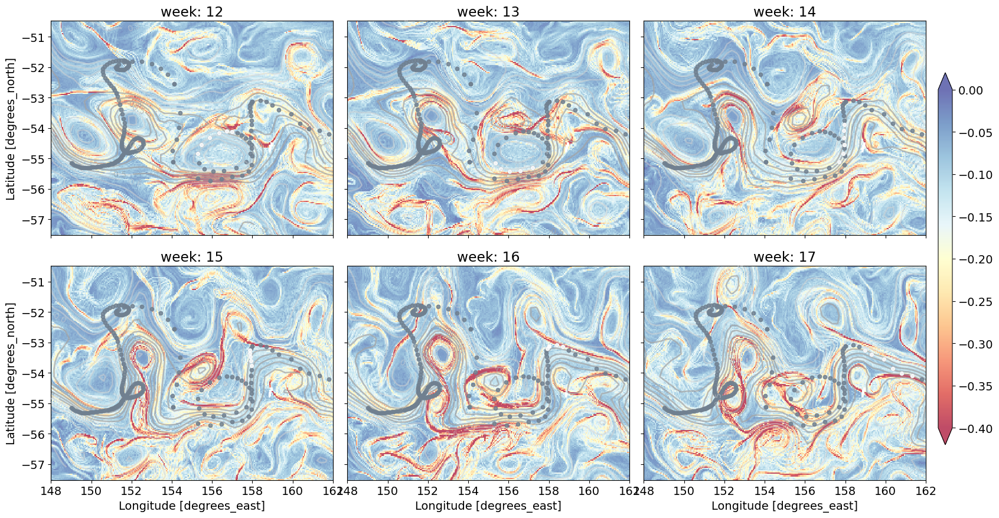

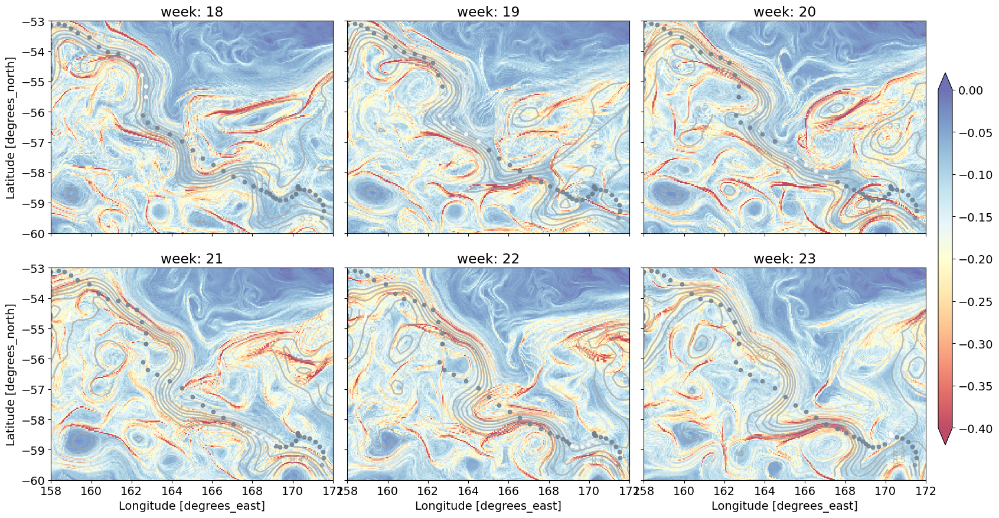

In [21]:
imp.reload(plots)

contours = np.arange(-0.5,0,0.1)
# contours = np.arange(-0.7,0.3,0.2)
week_sets = [[0, 1, 2, 3, 4, 5], [6, 7, 8, 9, 10, 11], [12, 13, 14, 15, 16, 17], [18, 19, 20, 21, 22, 23]]

floatid = 8489
float_num = ema[floatid]

for wks in week_sets:
    plots.weekPanel(floatid, float_num, ds.fsle_max, alt_cmems.adt, wks, contours, col = 'grey',
                    cmap = 'RdYlBu', vmin = -0.4, vmax = 0, alpha = 0.7)

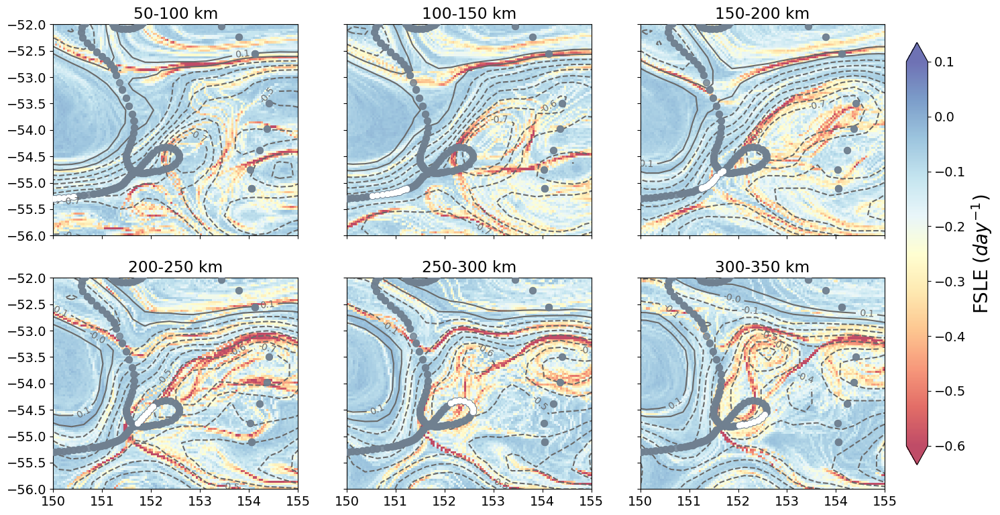

In [22]:
fig, axs = plt.subplots(nrows = 2, ncols=3, sharey = True, sharex = True, figsize = (16,9))
axs = axs.flatten()

lonmin, lonmax = 150, 155
latmin, latmax = -56, -52

dists = [100, 200, 300, 400, 500, 600]
dists = [50, 100, 150, 200, 250, 300]

i = 0
for d in dists:
    # indices where the float dynamic height changes dramatically and ssh agrees
    d2 = d+(dists[1]-dists[0])
    ind_list = np.where(np.logical_and(dist > d, dist < d2))[0].tolist()

    
    start = float_num.time.values[ind_list][0]
    end = float_num.time.values[ind_list][-1]
    st = str(start.astype('M8[D]'))
    en = str(end.astype('M8[D]'))

    # time-mean fields 
    m_fsle = ds.fsle_max.sel(time = slice(st, en)).mean(dim = 'time')
    msl = alt_cmems.adt.sel(time = slice(st, en)).mean(dim = 'time')


    im = m_fsle.sel(latitude = slice(latmin,latmax), longitude = slice(lonmin,lonmax)).plot(ax = axs[i], cmap = 'RdYlBu', 
                                                                                            vmin = -0.6, vmax = 0.1,
                                                                                           alpha = 0.7, add_colorbar = False)

    F = np.arange(-0.7,0.2,0.1)
    CS = msl.plot.contour(ax = axs[i], colors = 'dimgrey', linewidths = 1.5, levels = F)
    plt.clabel(CS, inline=True, fontsize=10, fmt = '%1.1f')

    axs[i].scatter(float_num.longitude, float_num.latitude, s = 50, c= 'slategrey', zorder = 3, alpha = 0.8)
    axs[i].scatter(float_num.longitude[ind_list], float_num.latitude[ind_list], s = 30, c='w', zorder = 4)
    axs[i].set_ylabel('')
    axs[i].set_xlabel('')
    axs[i].set_title(f'{d}-{d2} km')
    
    i += 1

cax = plt.axes([0.92, 0.15, 0.02, 0.7])
clb = plt.colorbar(im, cax = cax, extend = 'both')
clb.set_label('FSLE ($day^{-1}$)', fontsize = 20)


In [23]:
ds.fsle_max

<xarray.DataArray 'fsle_max' (time: 603, latitude: 251, longitude: 1001)>
[151504353 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 2018-10-01 2018-10-02 ... 2020-06-01
  * latitude   (latitude) float32 -59.98 -59.94 -59.9 ... -50.06 -50.02 -49.98
  * longitude  (longitude) float32 140.0 140.0 140.1 140.1 ... 179.9 179.9 180.0
Attributes:
    long_name:     FSLEs based on the maximum eigenvalue of the Cauchy-Green ...
    units:         days-1
    grid_mapping:  crs
    _ChunkSizes:   [   1 1331 2663]

High values of FSLE: strong stretching, transport fronts


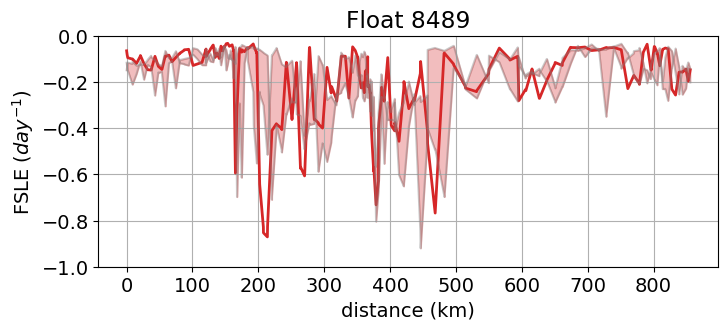

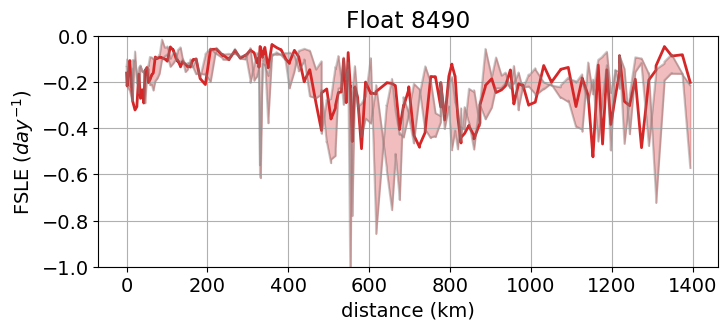

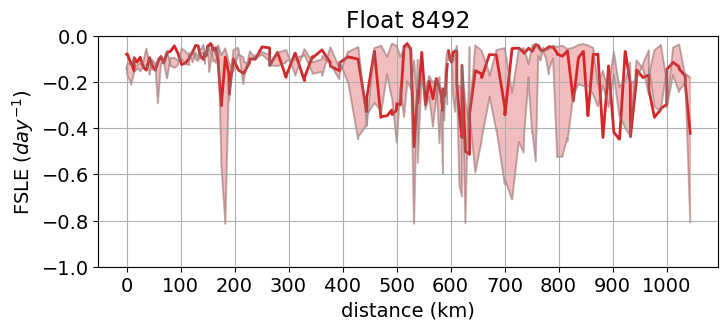

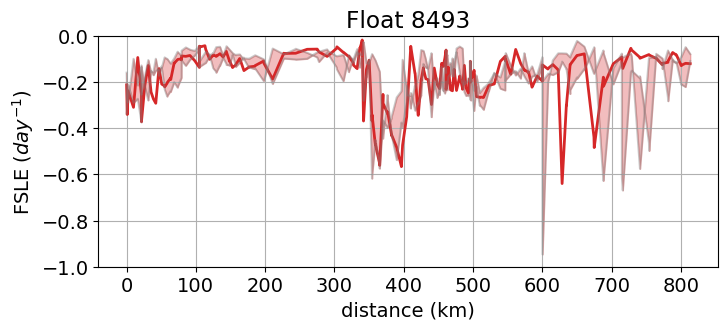

In [28]:
floatids = [8489, 8490, 8492, 8493]
for floatid in floatids: 
    float_num = ema[floatid]
    rs = calc.findRSperiod(float_num)
    dist = calc.cum_dist(float_num.longitude, float_num.latitude)
    
    nearest, lowerlim, upperlim = stats.temporalError(float_num, ds.fsle_max, method = 'nearest')
    
    fig, ax = plt.subplots(figsize = (8,3))

    ax.plot(dist[rs], nearest, linewidth=2, color = 'tab:red')
    plt.plot(dist[rs], lowerlim, c = 'grey', alpha = 0.4)
    plt.plot(dist[rs], upperlim, c = 'grey', alpha = 0.4)
    ax.fill_between(dist[rs], lowerlim, upperlim, alpha=0.3, color = 'tab:red')
    
    plt.grid(True)
    plt.ylim(-1, 0)
    plt.ylabel('FSLE ($day^{-1}$)')
    plt.xlabel('distance (km)')
    plt.title(f'Float {floatid}')

    if floatid == 8490:
        ax.xaxis.set_major_locator(MultipleLocator(200))
    else:
        ax.xaxis.set_major_locator(MultipleLocator(100))
    

print('High values of FSLE: strong stretching, transport fronts')